# Import the necessary libraries

In [1]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from IPython.core.display import HTML
%matplotlib inline
warnings.filterwarnings('ignore') # warnings will be ignored.

# Reading csv file from local system and storing into a dataframe¶

In [2]:
#Reading the data set
df= pd.read_csv('loan.csv')
df.head() # Top 5 rows of dataframe


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [3]:
df.shape #shape of the dataframe

(39717, 111)

In [4]:
#display max rows and columns
pd.set_option('display.max_rows',1000) #Max rows to 1000
pd.set_option('display.max_columns',10000) # MAx columns to 10000

In [5]:
df.info() # DAtaframe information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


# Cleaning

In [6]:
df.isnull().sum() # Cecking for null values

id                                    0
member_id                             0
loan_amnt                             0
funded_amnt                           0
funded_amnt_inv                       0
term                                  0
int_rate                              0
installment                           0
grade                                 0
sub_grade                             0
emp_title                          2459
emp_length                         1075
home_ownership                        0
annual_inc                            0
verification_status                   0
issue_d                               0
loan_status                           0
pymnt_plan                            0
url                                   0
desc                              12940
purpose                               0
title                                11
zip_code                              0
addr_state                            0
dti                                   0


In [7]:
round(df.isnull().sum()/len(df.index)*100,2) #Percentage of null values

id                                  0.00
member_id                           0.00
loan_amnt                           0.00
funded_amnt                         0.00
funded_amnt_inv                     0.00
term                                0.00
int_rate                            0.00
installment                         0.00
grade                               0.00
sub_grade                           0.00
emp_title                           6.19
emp_length                          2.71
home_ownership                      0.00
annual_inc                          0.00
verification_status                 0.00
issue_d                             0.00
loan_status                         0.00
pymnt_plan                          0.00
url                                 0.00
desc                               32.58
purpose                             0.00
title                               0.03
zip_code                            0.00
addr_state                          0.00
dti             

Most of thecolumns have 100% null values.

In [8]:
df.columns # Columns name of data frame df

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)

In [9]:
df1=df.dropna(axis=1,how='all')  # dropping columns which contains all null values
df1.shape

(39717, 57)

Intial columns were 111, after dropping columns where all tha datas are null, columns got reduced to 57

In [10]:
df1.info() #Informata of df1 datafram

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 57 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  int64  
 1   member_id                   39717 non-null  int64  
 2   loan_amnt                   39717 non-null  int64  
 3   funded_amnt                 39717 non-null  int64  
 4   funded_amnt_inv             39717 non-null  float64
 5   term                        39717 non-null  object 
 6   int_rate                    39717 non-null  object 
 7   installment                 39717 non-null  float64
 8   grade                       39717 non-null  object 
 9   sub_grade                   39717 non-null  object 
 10  emp_title                   37258 non-null  object 
 11  emp_length                  38642 non-null  object 
 12  home_ownership              39717 non-null  object 
 13  annual_inc                  397

# Data Study & Exploring

In [11]:
(df1.select_dtypes(include='object')).columns #Columns where datatype is object

Index(['term', 'int_rate', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'verification_status', 'issue_d', 'loan_status',
       'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'earliest_cr_line', 'revol_util', 'initial_list_status',
       'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d',
       'application_type'],
      dtype='object')

In [12]:
df1.select_dtypes(include='object') # Selecting object datatypes columns

,term,int_rate,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,earliest_cr_line,revol_util,initial_list_status,last_pymnt_d,next_pymnt_d,last_credit_pull_d,application_type
0,36 months,10.65%,B,B2,NaN,10+ years,RENT,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,Jan-85,83.70%,f,Jan-15,NaN,May-16,INDIVIDUAL
1,60 months,15.27%,C,C4,Ryder,< 1 year,RENT,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,Apr-99,9.40%,f,Apr-13,NaN,Sep-13,INDIVIDUAL
2,36 months,15.96%,C,C5,NaN,10+ years,RENT,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,Nov-01,98.50%,f,Jun-14,NaN,May-16,INDIVIDUAL
3,36 months,13.49%,C,C1,AIR RESOURCES BOARD,10+ years,RENT,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,Feb-96,21%,f,Jan-15,NaN,Apr-16,INDIVIDUAL
4,60 months,12.69%,B,B5,University Medical Group,1 year,RENT,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,Jan-96,53.90%,f,May-16,Jun-16,May-16,INDIVIDUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,36 months,8.07%,A,A4,FiSite Research,4 years,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Our current gutter system on our home is old a...,home_improvement,Home Improvement,802xx,CO,Nov-90,13.10%,f,Jul-10,NaN,Jun-10,INDIVIDUAL
39713,36 months,10.28%,C,C1,"Squarewave Solutions, Ltd.",3 years,RENT,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,The rate of interest and fees incurred by carr...,credit_card,Retiring credit card debt,274xx,NC,Dec-86,26.90%,f,Jul-10,NaN,Jul-10,INDIVIDUAL
39714,36 months,8.07%,A,A4,NaN,< 1 year,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,MBA Loan Consolidation,017xx,MA,Oct-98,19.40%,f,Apr-08,NaN,Jun-07,INDIVIDUAL
39715,36 months,7.43%,A,A2,NaN,< 1 year,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,other,JAL Loan,208xx,MD,Nov-88,0.70%,f,Jan-08,NaN,Jun-07,INDIVIDUAL


In [13]:
df1.term.unique() #Unique datatypes of column name term

array([' 36 months', ' 60 months'], dtype=object)

In [16]:
df1.columns=df1.columns.str.replace('term','term_in_months') # Renaming column name term to term in months
df1.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term_in_months', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_title', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url',
       'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'policy_code', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'pub_rec_bankruptci

In [17]:
df1['term_in_months']=df1['term_in_months'].apply(lambda x: x[:3]) ## removing "months" 
df1['term_in_months']

0         36
1         60
2         36
3         36
4         60
        ... 
39712     36
39713     36
39714     36
39715     36
39716     36
Name: term_in_months, Length: 39717, dtype: object

In [18]:
df1['term_in_months'].unique() #data uniques

array([' 36', ' 60'], dtype=object)

In [19]:
df1['term_in_months']=df1['term_in_months'].astype(int)  #Converting into integer
df1['term_in_months']

0        36
1        60
2        36
3        36
4        60
         ..
39712    36
39713    36
39714    36
39715    36
39716    36
Name: term_in_months, Length: 39717, dtype: int32

In [20]:
df1.select_dtypes(include='object') #selecting object type data

,int_rate,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,earliest_cr_line,revol_util,initial_list_status,last_pymnt_d,next_pymnt_d,last_credit_pull_d,application_type
0,10.65%,B,B2,NaN,10+ years,RENT,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,Jan-85,83.70%,f,Jan-15,NaN,May-16,INDIVIDUAL
1,15.27%,C,C4,Ryder,< 1 year,RENT,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,Apr-99,9.40%,f,Apr-13,NaN,Sep-13,INDIVIDUAL
2,15.96%,C,C5,NaN,10+ years,RENT,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,Nov-01,98.50%,f,Jun-14,NaN,May-16,INDIVIDUAL
3,13.49%,C,C1,AIR RESOURCES BOARD,10+ years,RENT,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,Feb-96,21%,f,Jan-15,NaN,Apr-16,INDIVIDUAL
4,12.69%,B,B5,University Medical Group,1 year,RENT,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,Jan-96,53.90%,f,May-16,Jun-16,May-16,INDIVIDUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,8.07%,A,A4,FiSite Research,4 years,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Our current gutter system on our home is old a...,home_improvement,Home Improvement,802xx,CO,Nov-90,13.10%,f,Jul-10,NaN,Jun-10,INDIVIDUAL
39713,10.28%,C,C1,"Squarewave Solutions, Ltd.",3 years,RENT,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,The rate of interest and fees incurred by carr...,credit_card,Retiring credit card debt,274xx,NC,Dec-86,26.90%,f,Jul-10,NaN,Jul-10,INDIVIDUAL
39714,8.07%,A,A4,NaN,< 1 year,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,MBA Loan Consolidation,017xx,MA,Oct-98,19.40%,f,Apr-08,NaN,Jun-07,INDIVIDUAL
39715,7.43%,A,A2,NaN,< 1 year,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,other,JAL Loan,208xx,MD,Nov-88,0.70%,f,Jan-08,NaN,Jun-07,INDIVIDUAL


In [21]:
(df1.select_dtypes(include='object')).columns #Object type columns

Index(['int_rate', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'verification_status', 'issue_d', 'loan_status',
       'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'earliest_cr_line', 'revol_util', 'initial_list_status',
       'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d',
       'application_type'],
      dtype='object')

In [22]:
df1[['int_rate', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'verification_status', 'issue_d', 'loan_status',
       'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'earliest_cr_line', 'revol_util', 'initial_list_status',
       'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d',
       'application_type']]  #Selecting certail columns

,int_rate,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,earliest_cr_line,revol_util,initial_list_status,last_pymnt_d,next_pymnt_d,last_credit_pull_d,application_type
0,10.65%,B,B2,NaN,10+ years,RENT,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,Jan-85,83.70%,f,Jan-15,NaN,May-16,INDIVIDUAL
1,15.27%,C,C4,Ryder,< 1 year,RENT,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,Apr-99,9.40%,f,Apr-13,NaN,Sep-13,INDIVIDUAL
2,15.96%,C,C5,NaN,10+ years,RENT,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,Nov-01,98.50%,f,Jun-14,NaN,May-16,INDIVIDUAL
3,13.49%,C,C1,AIR RESOURCES BOARD,10+ years,RENT,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,Feb-96,21%,f,Jan-15,NaN,Apr-16,INDIVIDUAL
4,12.69%,B,B5,University Medical Group,1 year,RENT,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,Jan-96,53.90%,f,May-16,Jun-16,May-16,INDIVIDUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,8.07%,A,A4,FiSite Research,4 years,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Our current gutter system on our home is old a...,home_improvement,Home Improvement,802xx,CO,Nov-90,13.10%,f,Jul-10,NaN,Jun-10,INDIVIDUAL
39713,10.28%,C,C1,"Squarewave Solutions, Ltd.",3 years,RENT,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,The rate of interest and fees incurred by carr...,credit_card,Retiring credit card debt,274xx,NC,Dec-86,26.90%,f,Jul-10,NaN,Jul-10,INDIVIDUAL
39714,8.07%,A,A4,NaN,< 1 year,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,MBA Loan Consolidation,017xx,MA,Oct-98,19.40%,f,Apr-08,NaN,Jun-07,INDIVIDUAL
39715,7.43%,A,A2,NaN,< 1 year,MORTGAGE,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,other,JAL Loan,208xx,MD,Nov-88,0.70%,f,Jan-08,NaN,Jun-07,INDIVIDUAL


In [23]:
df1.int_rate=df1.int_rate.apply(lambda x: x[:-1]) # Removing percentage

In [24]:
df1.columns=df1.columns.str.replace('revol_util','revol_util_percent') #Renaming column
df1.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term_in_months', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_title', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url',
       'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util_percent', 'total_acc',
       'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'policy_code', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'pub_rec_ba

In [25]:
df1['revol_util_percent']=df1['revol_util_percent'].str.replace('%', '').astype(float) #Removing symbol % and converting to float

In [26]:
df1.revol_util_percent.dtype

dtype('float64')

In [27]:
df1[['chargeoff_within_12_mths','delinq_amnt' ]].describe() #Statistics

,chargeoff_within_12_mths,delinq_amnt
count,39661.0,39717.0
mean,0.0,0.0
std,0.0,0.0
min,0.0,0.0
25%,0.0,0.0
50%,0.0,0.0
75%,0.0,0.0
max,0.0,0.0


In [28]:
(df1.drop(columns=['collections_12_mths_ex_med','acc_now_delinq','tax_liens'])).shape #dropping column

(39717, 54)

In [29]:
df1.shape

(39717, 57)

In [30]:
df1.drop(columns=['chargeoff_within_12_mths','delinq_amnt'],inplace=True)

In [31]:
df1.shape

(39717, 55)

In [32]:
(df1.drop(columns=['collections_12_mths_ex_med','acc_now_delinq','tax_liens'])).shape

(39717, 52)

In [33]:
df1.drop(columns=['collections_12_mths_ex_med','acc_now_delinq','tax_liens'],inplace=True) #Dropping the columns

In [35]:
df1.describe() #Stactics of df1

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term_in_months,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util_percent,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,policy_code,pub_rec_bankruptcies
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,14035.000000,2786.000000,39717.000000,39717.000000,39717.000000,39667.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.0,39020.000000
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,42.418007,324.561922,6.896893e+04,13.315130,0.146512,0.869200,35.900962,69.698134,9.294408,0.055065,13382.528086,48.832152,22.088828,51.227887,50.989768,12153.596544,11567.149118,9793.348813,2263.663172,1.363015,95.221624,12.406112,2678.826162,1.0,0.043260
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,10.622815,208.874874,6.379377e+04,6.678594,0.491812,1.070219,22.020060,43.822529,4.400282,0.237200,15885.016641,28.332634,11.401709,375.172839,373.824457,9042.040766,8942.672613,7065.522127,2608.111964,7.289979,688.744771,148.671593,4447.136012,0.0,0.204324
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,36.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,36.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,18.000000,22.000000,6.000000,0.000000,3703.000000,25.400000,13.000000,0.000000,0.000000,5576.930000,5112.310000,4600.000000,662.180000,0.000000,0.000000,0.000000,218.680000,1.0,0.000000
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,36.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,34.000000,90.000000,9.000000,0.000000,8850.000000,49.300000,20.000000,0.000000,0.000000,9899.640319,9287.150000,8000.000000,1348.910000,0.000000,0.000000,0.000000,546.140000,1.0,0.000000
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,60.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,52.000000,104.000000,12.000000,0.000000,17058.000000,72.400000,29.000000,0.000000,0.000000,16534.433040,15798.810000,13653.260000,2833.400000,0.000000,0.000000,0.000000,3293.160000,1.0,0.000000
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,60.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,120.000000,129.000000,44.000000,4.000000,149588.000000,99.900000,90.000000,6311.470000,6307.370000,58563.679930,58563.680000,35000.020000,23563.680000,180.200000,29623.350000,7002.190000,36115.200000,1.0,2.000000


# Exploratory Data Analysis

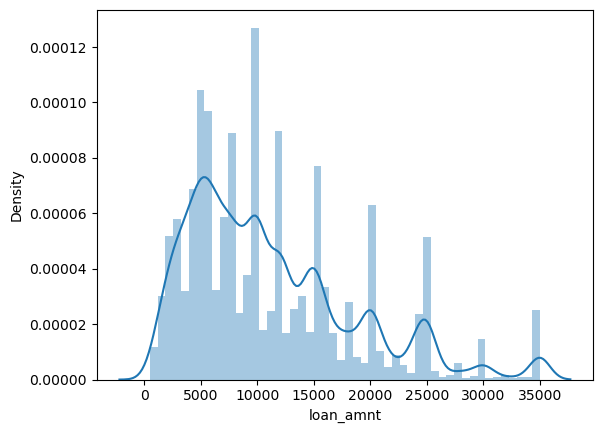

In [36]:
sns.distplot(df1['loan_amnt'])
plt.show()

Maximum distibution is inthe range 50000 andpositivey skewed

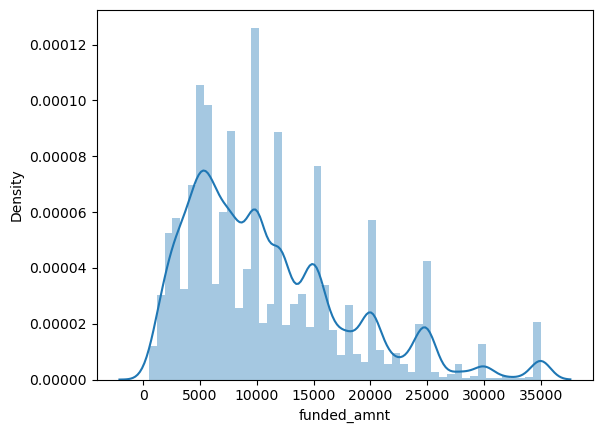

In [37]:
sns.distplot(df1['funded_amnt'])
plt.show()

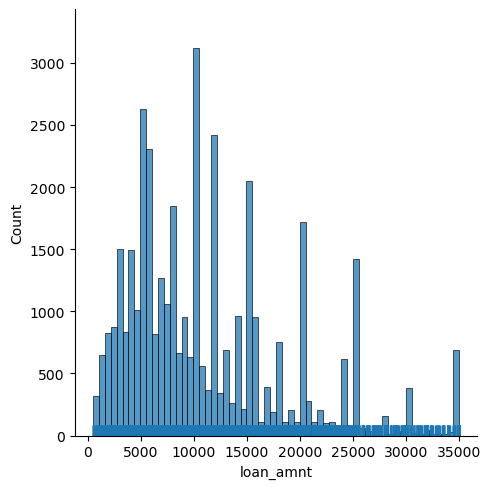

In [38]:
sns.displot(df1['loan_amnt'],kind='hist',rug=True)

Freequency of max loan amount is in the range 5000 to 10000

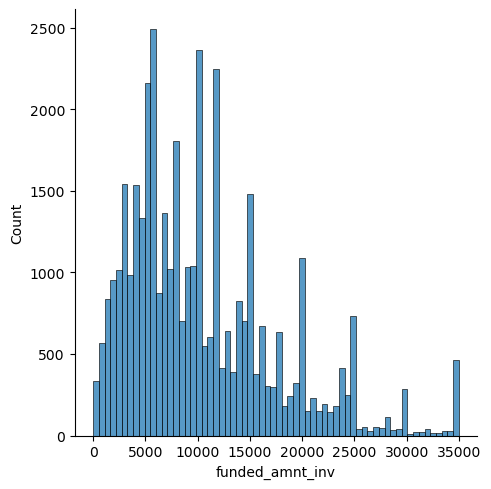

In [39]:
sns.displot(df1['funded_amnt_inv'])

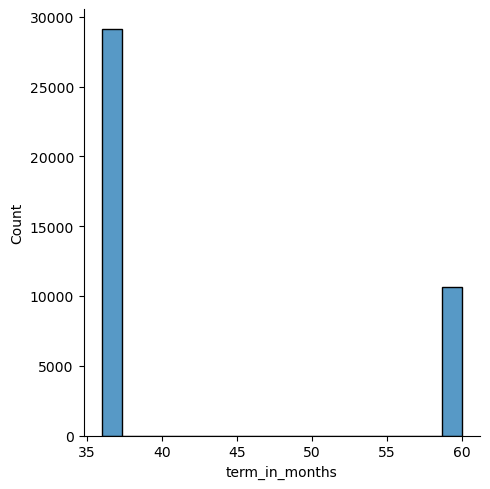

In [40]:
sns.displot(df1['term_in_months'])

Max loan amount sactioned for 35 months

<Axes: >

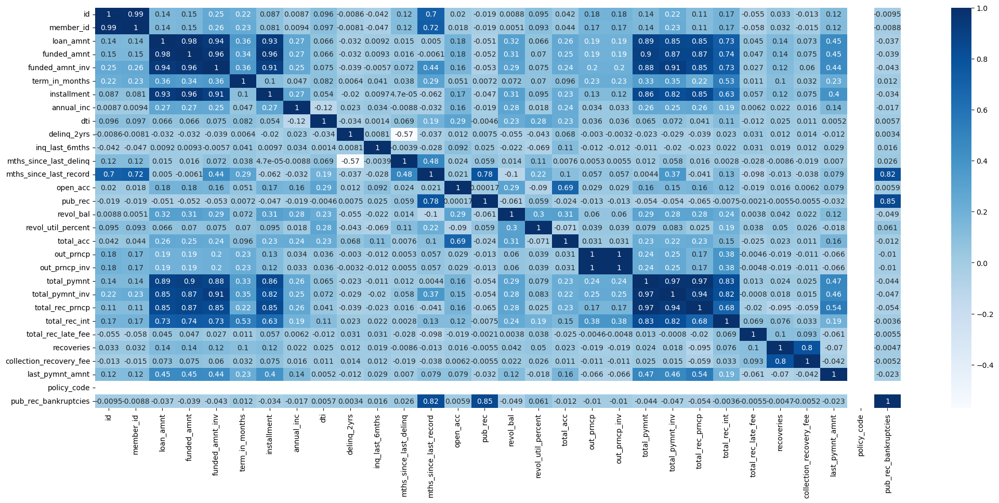

In [41]:
corr=df1.corr()
plt.figure(figsize=(25,10))
sns.heatmap(corr,annot=True,cmap='Blues')

Correlation plot of df1 dataframe

In [42]:
corr1=corr[abs(corr) > 0.9] # In the form of dataframe
corr1

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term_in_months,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util_percent,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,policy_code,pub_rec_bankruptcies
id,1.00000,0.99365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
member_id,0.99365,1.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan_amnt,NaN,NaN,1.000000,0.981578,0.940034,NaN,0.930288,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
funded_amnt,NaN,NaN,0.981578,1.000000,0.958422,NaN,0.956159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.903160,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
funded_amnt_inv,NaN,NaN,0.940034,0.958422,1.000000,NaN,0.905039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.913257,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
term_in_months,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
installment,NaN,NaN,0.930288,0.956159,0.905039,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
annual_inc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dti,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
delinq_2yrs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
df1.home_ownership.unique()

array(['RENT', 'OWN', 'MORTGAGE', 'OTHER', 'NONE'], dtype=object)

<Axes: xlabel='loan_amnt', ylabel='funded_amnt'>

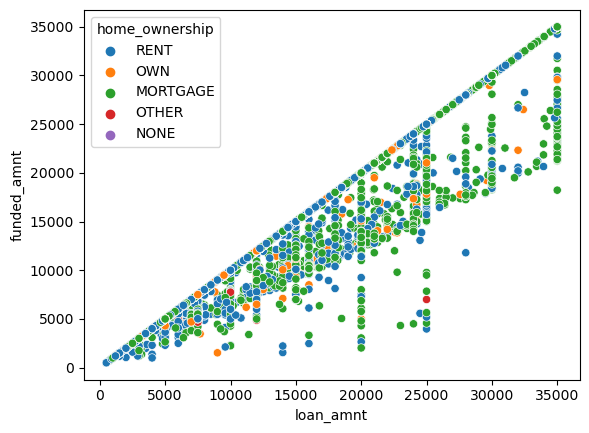

In [44]:
sns.scatterplot(data=df1,x='loan_amnt',y='funded_amnt',hue='home_ownership')

Most of the loan holders are of rent home ownership

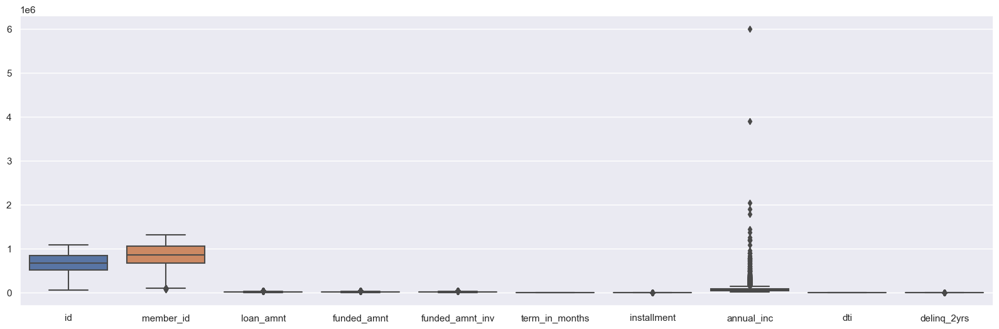

In [46]:
sns.set_theme(style='darkgrid')
plt.figure(figsize=(20,6))
sns.boxplot(data=df1[['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term_in_months', 'installment', 'annual_inc', 'dti', 'delinq_2yrs']])
plt.show()

Most of the outliers data falls in annula income columns

In [47]:

df1.sub_grade.value_counts(normalize=True) # Values counts in percentages

B3    0.073445
A4    0.072664
A5    0.069038
B5    0.068082
B4    0.063247
C1    0.053780
B2    0.051791
C2    0.050633
B1    0.046076
A3    0.045572
C3    0.038497
A2    0.037969
D2    0.033940
C4    0.031120
C5    0.029861
D3    0.029534
A1    0.028678
D4    0.024700
D1    0.023441
D5    0.022006
E1    0.019211
E2    0.016517
E3    0.013924
E4    0.011431
E5    0.010474
F1    0.008284
F2    0.006269
F3    0.004658
F4    0.004230
F5    0.002971
G1    0.002619
G2    0.001964
G4    0.001410
G3    0.001209
G5    0.000755
Name: sub_grade, dtype: float64

In [48]:
df1.grade.value_counts()

B    12020
A    10085
C     8098
D     5307
E     2842
F     1049
G      316
Name: grade, dtype: int64

In [49]:
df1.home_ownership.value_counts()

RENT        18899
MORTGAGE    17659
OWN          3058
OTHER          98
NONE            3
Name: home_ownership, dtype: int64

In [50]:
df1[df1['annual_inc']>5000000]  #Outliers

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term_in_months,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util_percent,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,policy_code,application_type,pub_rec_bankruptcies
30107,513542,663575,5000,5000,5000.0,36,12.73,167.84,C,C1,post office,10+ years,MORTGAGE,6000000.0,Source Verified,May-10,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,home_improvement,home improvment,939xx,CA,0.01,0,Jan-01,1,80.0,NaN,2,0,1434,37.7,10,f,0.0,0.0,5514.49306,5514.49,5000.0,514.49,0.0,0.0,0.0,Apr-11,3845.25,NaN,May-11,1,INDIVIDUAL,0.0


In [51]:
df1['loan_status'].unique()

array(['Fully Paid', 'Charged Off', 'Current'], dtype=object)

In [52]:
df1.emp_title.value_counts()

US Army                              134
Bank of America                      109
IBM                                   66
AT&T                                  59
Kaiser Permanente                     56
                                    ... 
Community College of Philadelphia      1
AMEC                                   1
lee county sheriff                     1
Bacon County Board of Education        1
Evergreen Center                       1
Name: emp_title, Length: 28820, dtype: int64

In [53]:
df1[df1['loan_status']=='Charged Off'].emp_title.value_counts()

Bank of America              20
US Army                      18
Walmart                      14
UPS                          12
AT&T                         12
                             ..
U of D Jesuit High School     1
EEOC                          1
Life Ambulance                1
R. Young Enterprise, Inc.     1
Auto motors of miami          1
Name: emp_title, Length: 4636, dtype: int64

In [54]:
df1[df1['loan_status']=='Fully Paid'].grade.value_counts()

B    10250
A     9443
C     6487
D     3967
E     1948
F      657
G      198
Name: grade, dtype: int64

In [55]:
df1[df1['loan_status']=='Charged Off'].grade.value_counts()

B    1425
C    1347
D    1118
E     715
A     602
F     319
G     101
Name: grade, dtype: int64

In [56]:
(df1[df1['loan_status']=='Fully Paid'].grade.value_counts())-(df1[df1['loan_status']=='Charged Off'].grade.value_counts())

A    8841
B    8825
C    5140
D    2849
E    1233
F     338
G      97
Name: grade, dtype: int64

Text(0.5, 1.0, 'Defaulters')

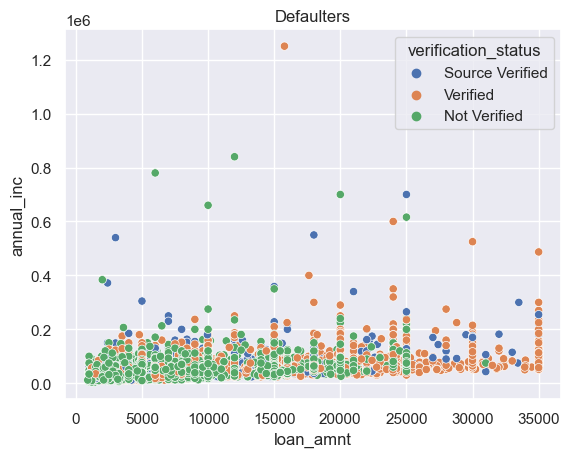

In [57]:
sns.scatterplot(data=df1[df1['loan_status']=='Charged Off'],y='annual_inc',x='loan_amnt',hue='verification_status')
plt.title('Defaulters')

In [58]:
df1.application_type.value_counts()

INDIVIDUAL    39717
Name: application_type, dtype: int64

In [59]:
df1=df1.drop(columns=['application_type']) #droppin since only one value
df1.shape

(39717, 51)

In [60]:
df1=df1.drop(columns=['pymnt_plan'])
df1.shape

(39717, 50)

In [61]:
df1.emp_length.unique()

array(['10+ years', '< 1 year', '1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '6 years', '2 years', '7 years', nan],
      dtype=object)

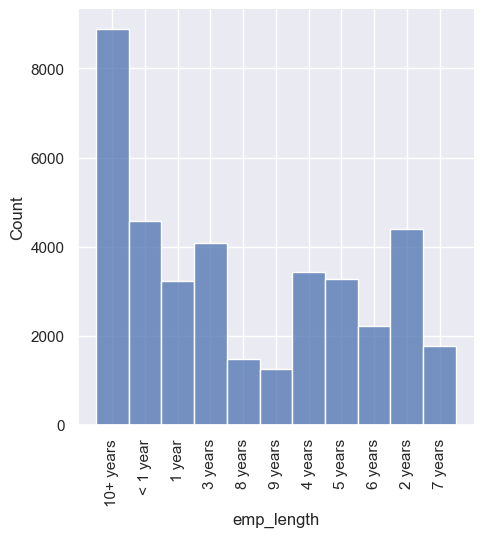

In [62]:
sns.displot(df1.emp_length)
plt.xticks(rotation=90)
plt.show()

Most of the loan memebers are greater nthan 10 years

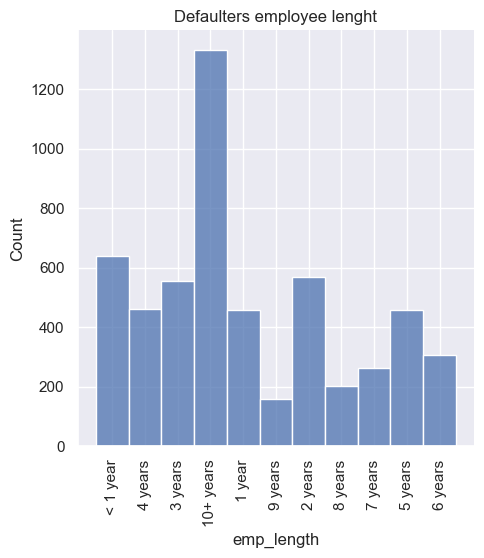

In [63]:
sns.displot(df1[df1['loan_status']=='Charged Off'].emp_length)
plt.xticks(rotation=90)
plt.title('Defaulters employee lenght')
plt.show()

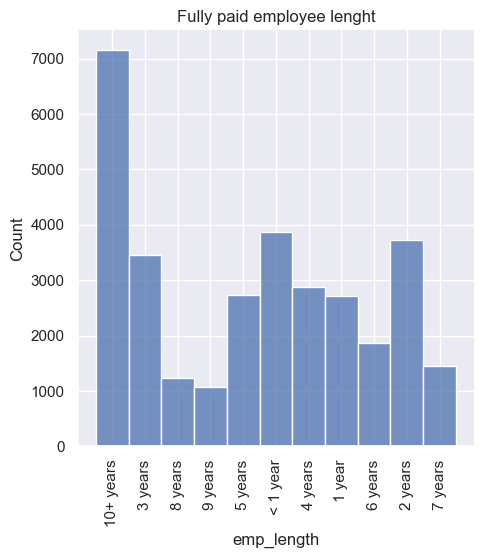

In [64]:
sns.displot(df1[df1['loan_status']=='Fully Paid'].emp_length)
plt.xticks(rotation=90)
plt.title('Fully paid employee lenght')
plt.show()

Text(0.5, 1.0, 'Fully pain loan status laod puposes histogram')

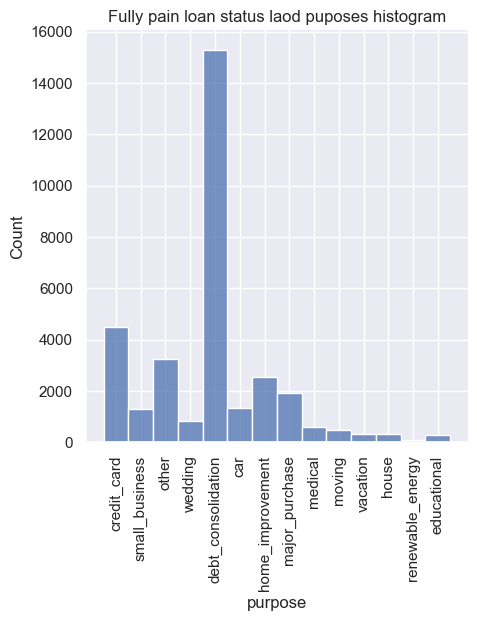

In [65]:
sns.displot(df1[df1['loan_status']=='Fully Paid'].purpose)
plt.xticks(rotation=90)
plt.title('Fully pain loan status laod puposes histogram')

Text(0.5, 1.0, 'Defaulters loan status laod puposes histogram')

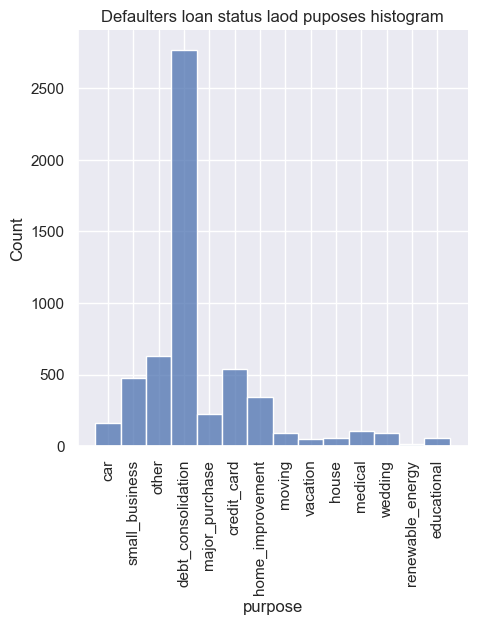

In [66]:
sns.displot(df1[df1['loan_status']=='Charged Off'].purpose)
plt.xticks(rotation=90)
plt.title('Defaulters loan status laod puposes histogram')

In [67]:
df1.addr_state.value_counts()

CA    7099
NY    3812
FL    2866
TX    2727
NJ    1850
IL    1525
PA    1517
VA    1407
GA    1398
MA    1340
OH    1223
MD    1049
AZ     879
WA     840
CO     792
NC     788
CT     751
MI     720
MO     686
MN     615
NV     497
SC     472
WI     460
AL     452
OR     451
LA     436
KY     325
OK     299
KS     271
UT     258
AR     245
DC     214
RI     198
NM     189
WV     177
HI     174
NH     171
DE     114
MT      85
WY      83
AK      80
SD      64
VT      54
MS      19
TN      17
IN       9
ID       6
IA       5
NE       5
ME       3
Name: addr_state, dtype: int64

<Figure size 2000x1000 with 0 Axes>

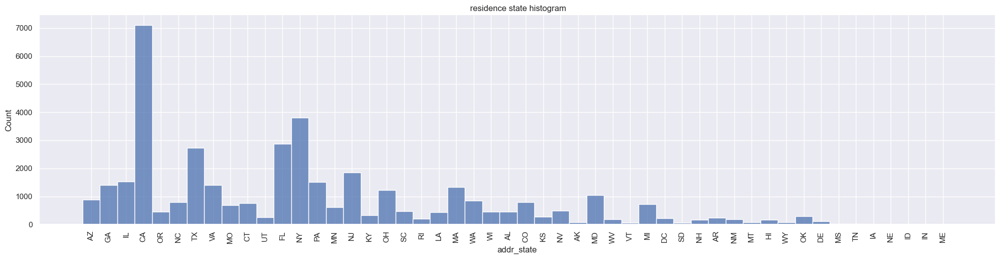

In [68]:
plt.figure(figsize=[20,10])
sns.displot(df1.addr_state,height=5,aspect=4)
plt.xticks(rotation=90)
plt.title(' residence state histogram')
plt.show()

<Figure size 2000x1000 with 0 Axes>

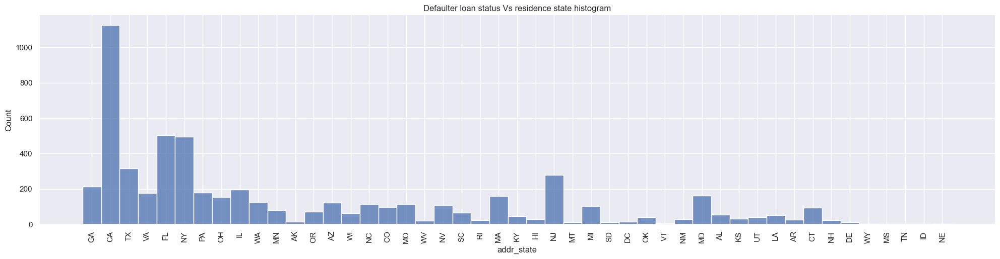

In [69]:
plt.figure(figsize=[20,10])
sns.displot(df1[df1['loan_status']=='Charged Off'].addr_state,height=5,aspect=4)
plt.xticks(rotation=90)
plt.title('Defaulter loan status Vs residence state histogram')
plt.show()

<Axes: xlabel='dti', ylabel='loan_amnt'>

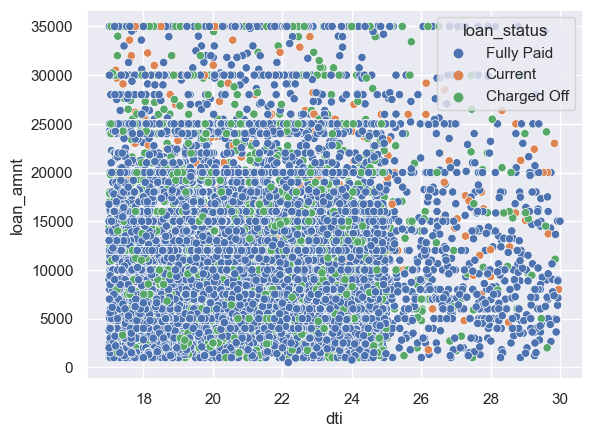

In [71]:
sns.scatterplot(data=df1[df1['dti']>17],y='loan_amnt',x='dti',hue='loan_status')

In [72]:
df1.delinq_2yrs.value_counts()

0     35405
1      3303
2       687
3       220
4        62
5        22
6        10
7         4
8         2
9         1
11        1
Name: delinq_2yrs, dtype: int64

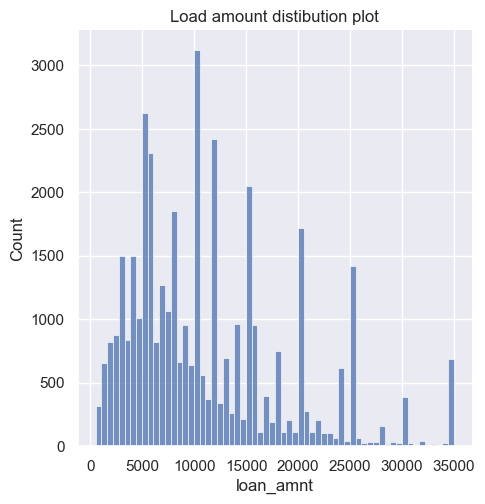

In [74]:
sns.displot(df1['loan_amnt'])
plt.title('Load amount distibution plot')
plt.show()

<Axes: ylabel='annual_inc'>

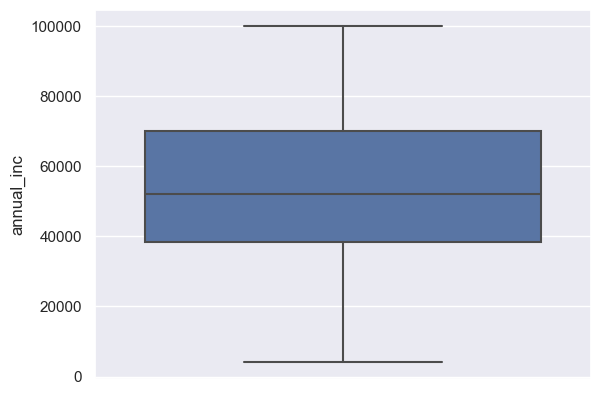

In [75]:
sns.boxplot(data=df1[df1['annual_inc']<100000],y='annual_inc')

In [76]:
df1[df1['annual_inc']<100000].loan_status.value_counts()

Fully Paid     27615
Charged Off     4983
Current          919
Name: loan_status, dtype: int64

<Axes: >

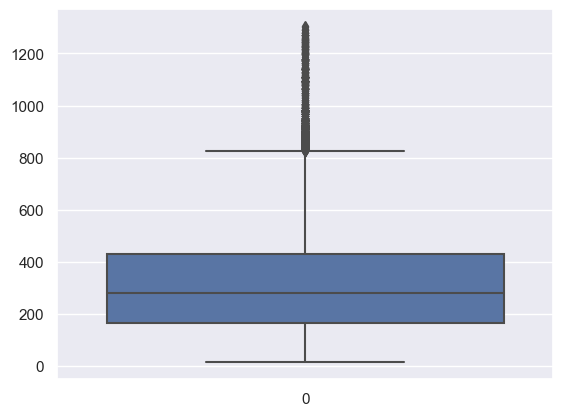

In [77]:
sns.boxplot(df1['installment'])

<Axes: xlabel='annual_inc', ylabel='installment'>

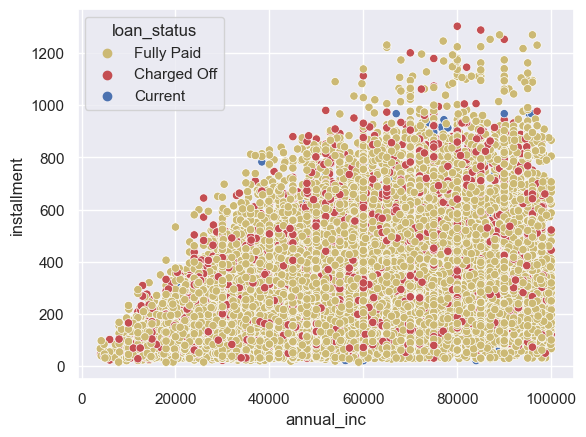

In [78]:
sns.scatterplot(data=df1[df1['annual_inc']<100000], x='annual_inc',y='installment',hue='loan_status',palette={'r','y','b'})

In [79]:
df1.var() # Checking for variance

id                         4.439202e+10
member_id                  7.058496e+10
loan_amnt                  5.560194e+07
funded_amnt                5.165640e+07
funded_amnt_inv            5.081481e+07
term_in_months             1.128442e+02
installment                4.362871e+04
annual_inc                 4.069645e+09
dti                        4.460361e+01
delinq_2yrs                2.418786e-01
inq_last_6mths             1.145369e+00
mths_since_last_delinq     4.848830e+02
mths_since_last_record     1.920414e+03
open_acc                   1.936249e+01
pub_rec                    5.626382e-02
revol_bal                  2.523338e+08
revol_util_percent         8.027381e+02
total_acc                  1.299990e+02
out_prncp                  1.407547e+05
out_prncp_inv              1.397447e+05
total_pymnt                8.175850e+07
total_pymnt_inv            7.997139e+07
total_rec_prncp            4.992160e+07
total_rec_int              6.802248e+06
total_rec_late_fee         5.314380e+01


In [80]:
df1.corrwith(df1['pub_rec']) # Finding correlation wothpub_rec

id                        -0.019440
member_id                 -0.018721
loan_amnt                 -0.051236
funded_amnt               -0.052169
funded_amnt_inv           -0.053214
term_in_months             0.007233
installment               -0.046532
annual_inc                -0.018689
dti                       -0.004621
delinq_2yrs                0.007463
inq_last_6mths             0.024802
mths_since_last_delinq     0.059105
mths_since_last_record     0.778721
open_acc                   0.000172
pub_rec                    1.000000
revol_bal                 -0.061413
revol_util_percent         0.059069
total_acc                 -0.023901
out_prncp                 -0.012675
out_prncp_inv             -0.012910
total_pymnt               -0.053668
total_pymnt_inv           -0.054101
total_rec_prncp           -0.065384
total_rec_int             -0.007470
total_rec_late_fee        -0.002071
recoveries                -0.005521
collection_recovery_fee   -0.005536
last_pymnt_amnt           -0

In [81]:
df1['loan_status'].value_counts()

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

In [82]:
df2=df1[df1['loan_status']!='Current'] # Removing current paying form dataframe
df2.shape

(38577, 50)

In [83]:
df2.loan_status.value_counts()

Fully Paid     32950
Charged Off     5627
Name: loan_status, dtype: int64

In [84]:
df2['loan_status']=df2.loan_status.apply(lambda x: 0 if x=='Fully Paid' else 1)

In [85]:
df2['loan_status'].value_counts() #Converting class

0    32950
1     5627
Name: loan_status, dtype: int64

In [86]:
df2.loan_status.describe()

count    38577.000000
mean         0.145864
std          0.352975
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: loan_status, dtype: float64

In [87]:
df2.corrwith(df2['loan_status']).sort_values(ascending=False)

loan_status                1.000000
recoveries                 0.339562
collection_recovery_fee    0.204914
term_in_months             0.173487
total_rec_late_fee         0.165115
revol_util_percent         0.099990
inq_last_6mths             0.071878
mths_since_last_record     0.063709
loan_amnt                  0.059463
funded_amnt                0.056497
pub_rec                    0.051001
pub_rec_bankruptcies       0.047757
dti                        0.045078
id                         0.042390
member_id                  0.039798
funded_amnt_inv            0.037781
installment                0.027153
delinq_2yrs                0.020096
total_rec_int              0.013008
revol_bal                  0.005854
mths_since_last_delinq     0.005377
open_acc                  -0.009140
total_acc                 -0.022608
annual_inc                -0.040867
last_pymnt_amnt           -0.222524
total_pymnt_inv           -0.232906
total_pymnt               -0.235898
total_rec_prncp           -0

<Axes: xlabel='loan_status', ylabel='annual_inc'>

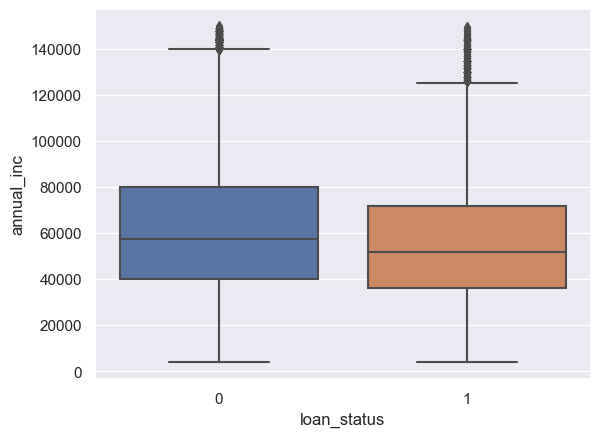

In [88]:
sns.boxplot(data=df2[df2['annual_inc']<150000], x='loan_status',y='annual_inc')

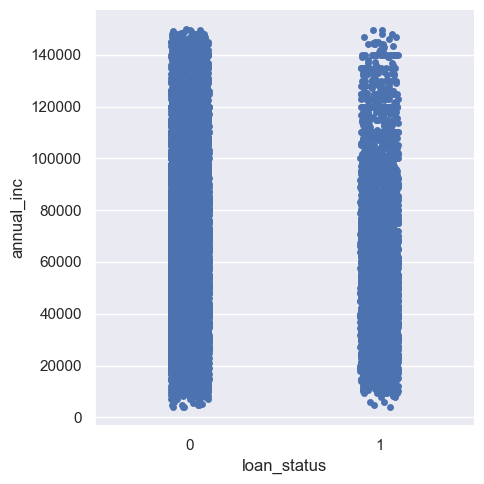

In [89]:
sns.catplot(data=df2[df2['annual_inc']<150000], x='loan_status',y='annual_inc')

<Axes: xlabel='loan_status', ylabel='annual_inc'>

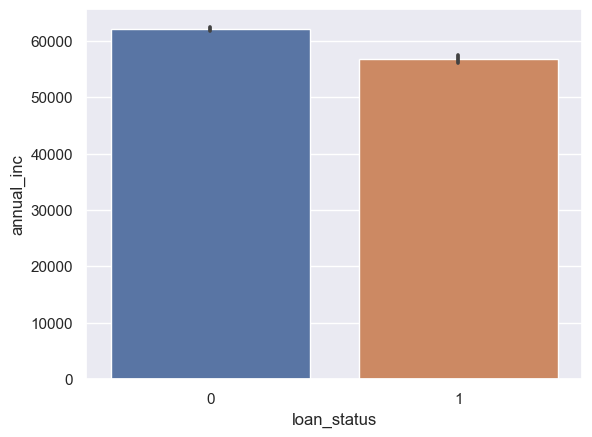

In [90]:
sns.barplot(data=df2[df2['annual_inc']<150000],x='loan_status',y='annual_inc')

<Axes: xlabel='grade', ylabel='loan_status'>

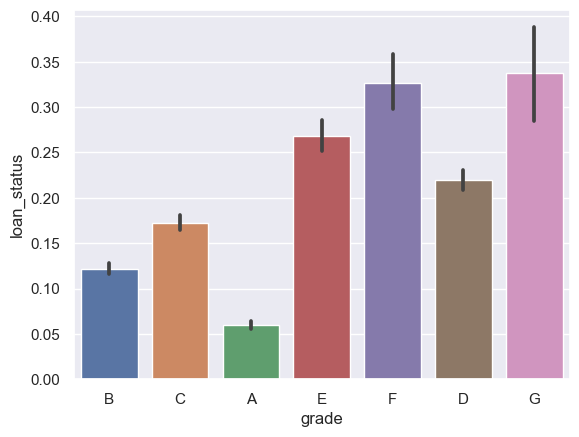

In [91]:
sns.barplot(data=df2,y='loan_status',x='grade')

<Axes: xlabel='sub_grade', ylabel='loan_status'>

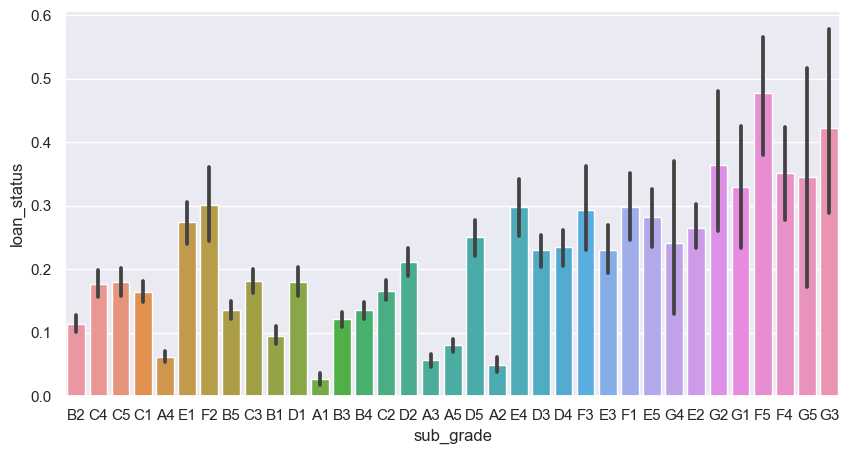

In [92]:
plt.figure(figsize=(10,5))
sns.barplot(data=df2,y='loan_status',x='sub_grade')

<Axes: xlabel='sub_grade', ylabel='annual_inc'>

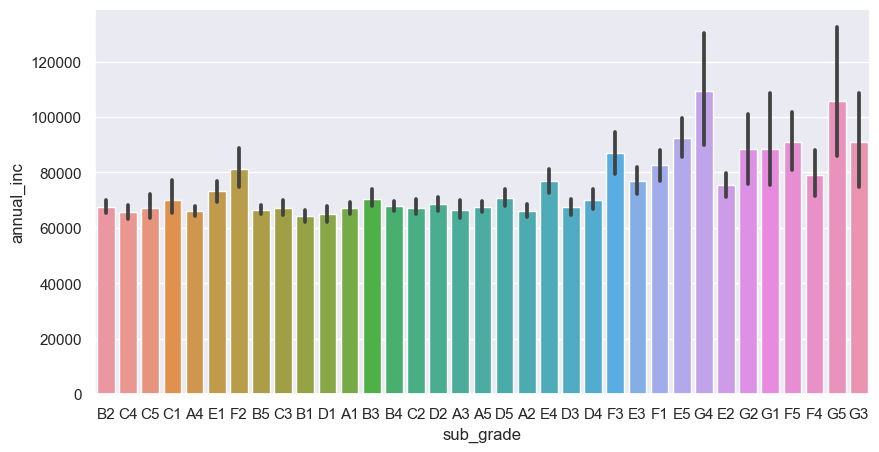

In [93]:
plt.figure(figsize=(10,5))
sns.barplot(data=df2,x='sub_grade',y='annual_inc')

<Axes: xlabel='grade', ylabel='loan_amnt'>

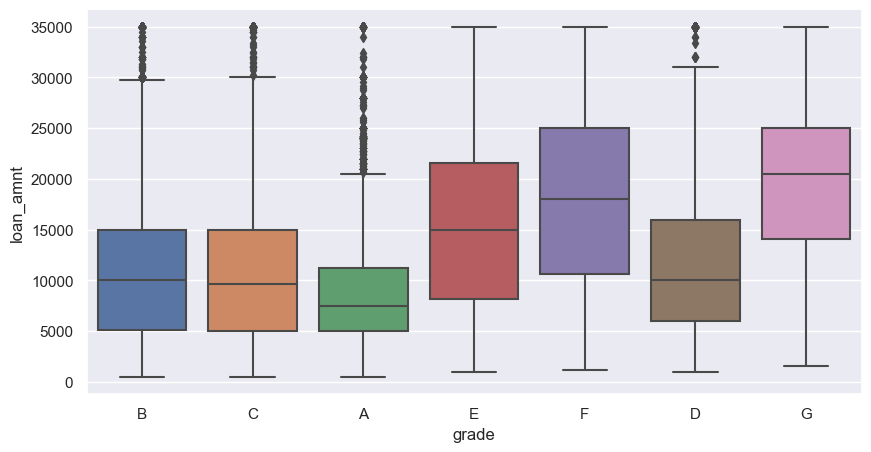

In [94]:
plt.figure(figsize=(10,5))
sns.boxplot(data=df2,x='grade',y='loan_amnt')

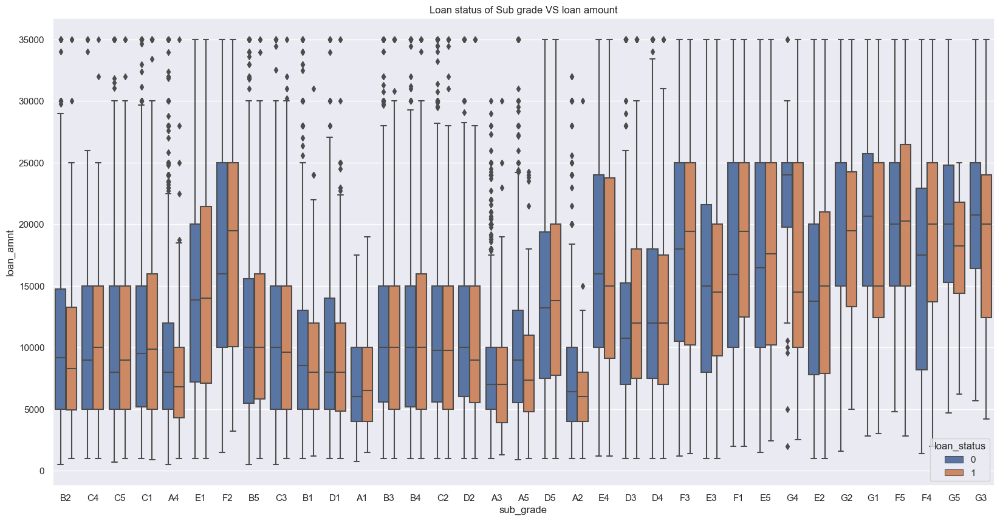

In [95]:
plt.figure(figsize=(20,10))
sns.boxplot(data=df2,x='sub_grade',y='loan_amnt',hue='loan_status')
plt.title('Loan status of Sub grade VS loan amount')
plt.show()


<Axes: xlabel='home_ownership', ylabel='loan_amnt'>

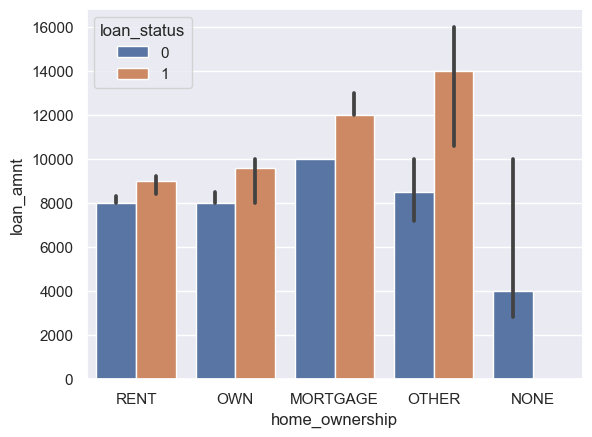

In [96]:
sns.barplot(data=df2,x='home_ownership',y='loan_amnt',hue='loan_status',estimator='median')

<Axes: xlabel='home_ownership', ylabel='loan_amnt'>

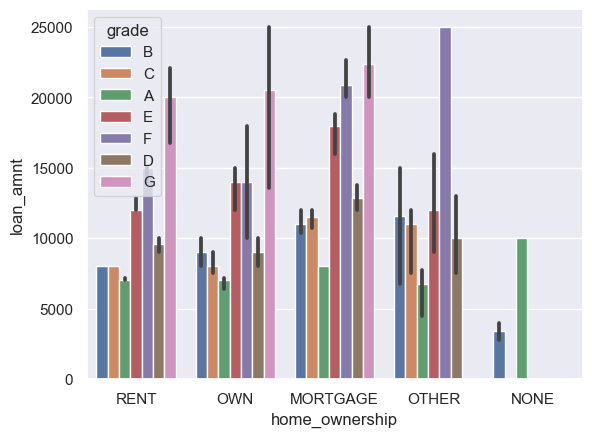

In [97]:
sns.barplot(data=df2,x='home_ownership',y='loan_amnt',hue='grade',estimator='median')

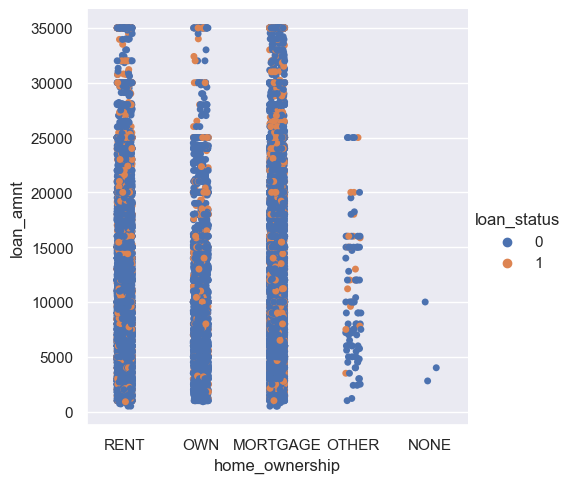

In [98]:
sns.catplot(data=df2,x='home_ownership',y='loan_amnt',hue='loan_status')

<Axes: xlabel='addr_state', ylabel='loan_amnt'>

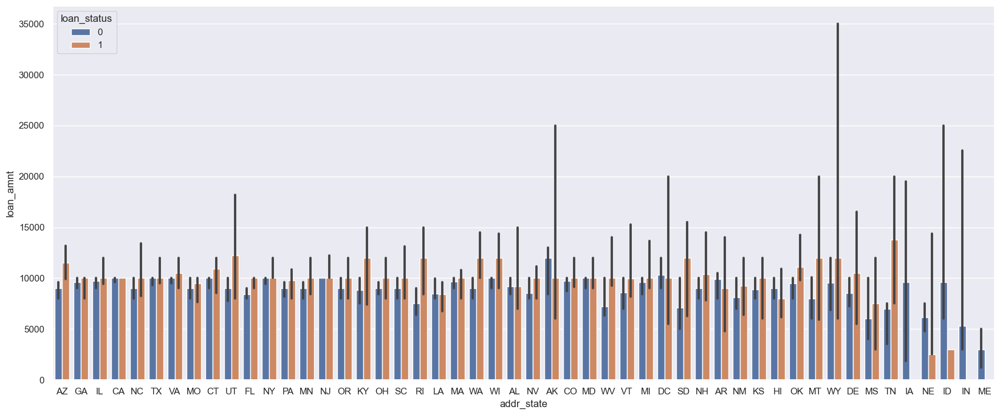

In [99]:
plt.figure(figsize=(20,8))
sns.barplot(data=df2,x='addr_state',y='loan_amnt',hue='loan_status',estimator='median')

In [100]:
df2['int_rate']=df2.int_rate.astype(float)

<Axes: xlabel='addr_state', ylabel='int_rate'>

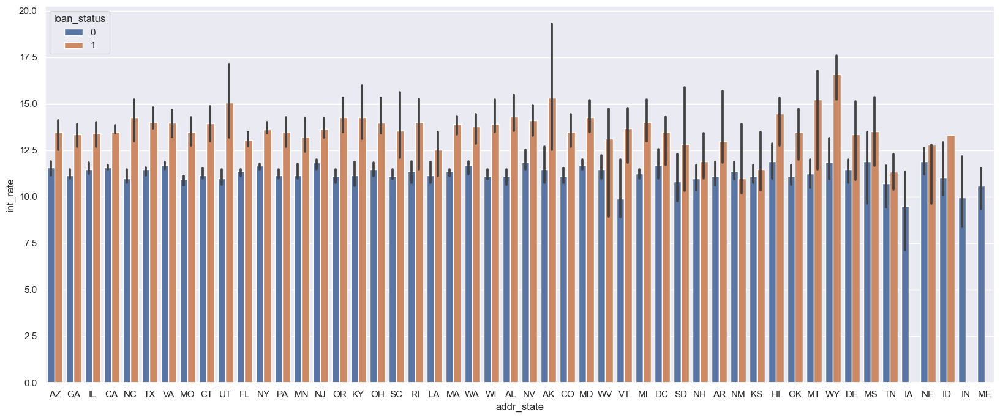

In [101]:
plt.figure(figsize=(20,8))
sns.barplot(data=df2,x='addr_state',y='int_rate',hue='loan_status',estimator='median')

<Axes: xlabel='home_ownership', ylabel='int_rate'>

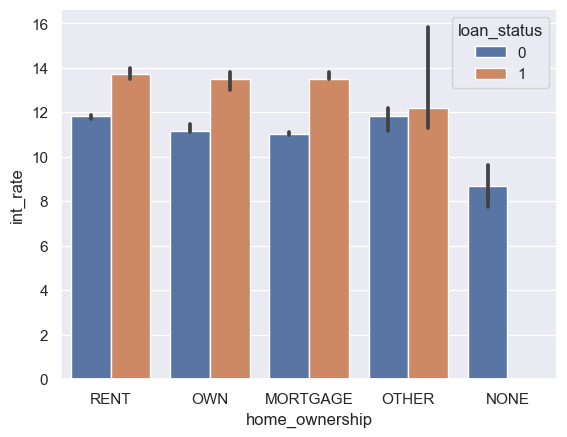

In [103]:
sns.barplot(data=df2,x='home_ownership',y='int_rate',hue='loan_status',estimator='median')

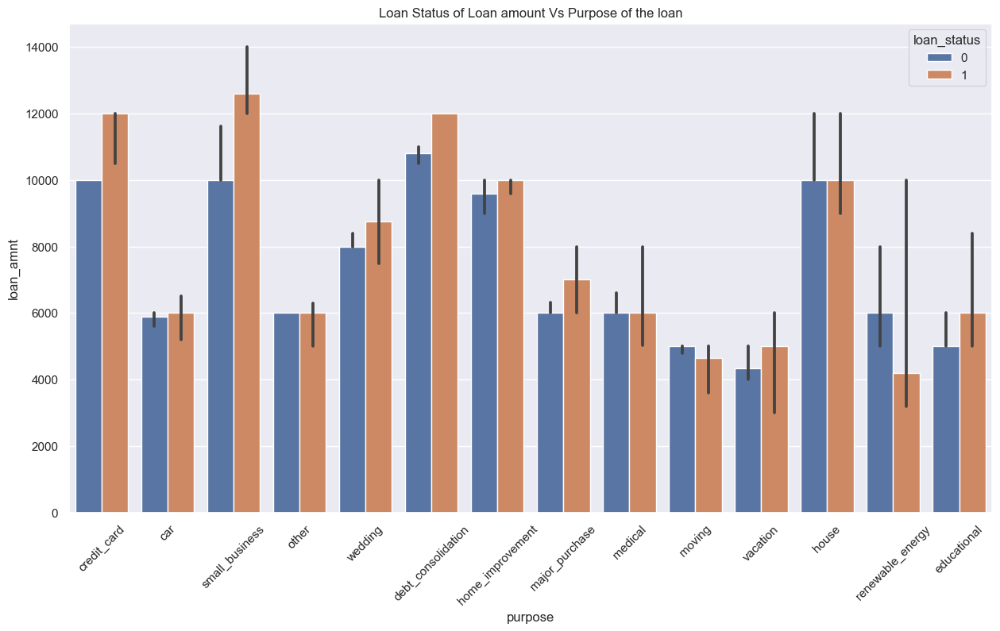

In [104]:
plt.figure(figsize=(15,8))
sns.barplot(data=df2,x='purpose',y='loan_amnt',hue='loan_status',estimator='median')
plt.xticks(rotation=45)
plt.title('Loan Status of Loan amount Vs Purpose of the loan')
plt.show()

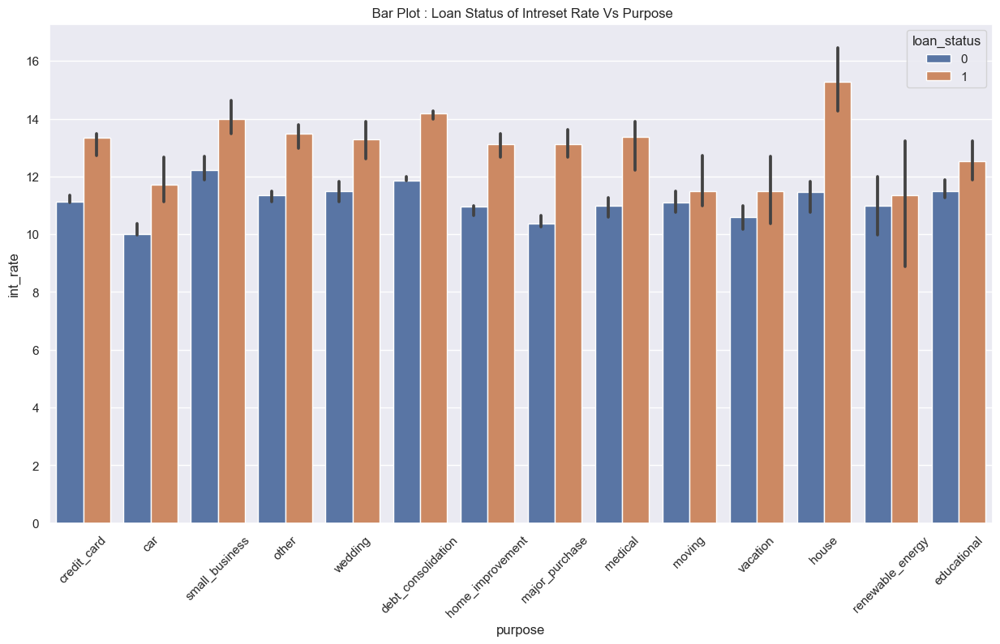

In [105]:
plt.figure(figsize=(15,8))
sns.barplot(data=df2,x='purpose',y='int_rate',hue='loan_status',estimator='median')
plt.xticks(rotation=45)
plt.title(" Bar Plot : Loan Status of Intreset Rate Vs Purpose")
plt.show()

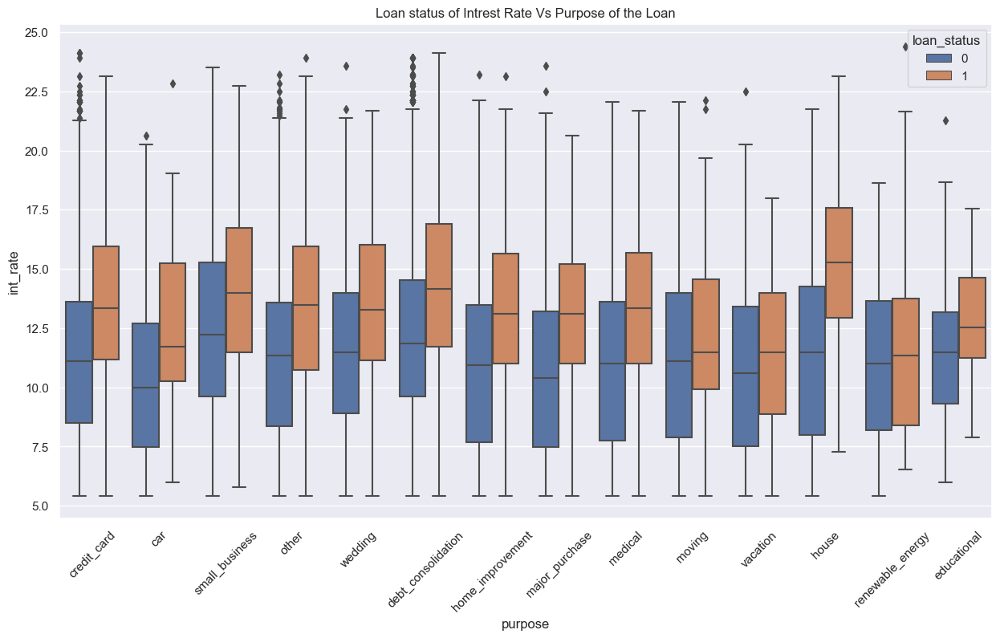

In [106]:
plt.figure(figsize=(15,8))
sns.boxplot(data=df2,x='purpose',y='int_rate',hue='loan_status')
plt.xticks(rotation=45)
plt.title('Loan status of Intrest Rate Vs Purpose of the Loan')
plt.show()

In [107]:
df2.issue_d.unique()

array(['Dec-11', 'Nov-11', 'Oct-11', 'Sep-11', 'Aug-11', 'Jul-11',
       'Jun-11', 'May-11', 'Apr-11', 'Mar-11', 'Feb-11', 'Jan-11',
       'Dec-10', 'Nov-10', 'Oct-10', 'Sep-10', 'Aug-10', 'Jul-10',
       'Jun-10', 'May-10', 'Apr-10', 'Mar-10', 'Feb-10', 'Jan-10',
       'Dec-09', 'Nov-09', 'Oct-09', 'Sep-09', 'Aug-09', 'Jul-09',
       'Jun-09', 'May-09', 'Apr-09', 'Mar-09', 'Feb-09', 'Jan-09',
       'Dec-08', 'Nov-08', 'Oct-08', 'Sep-08', 'Aug-08', 'Jul-08',
       'Jun-08', 'May-08', 'Apr-08', 'Mar-08', 'Feb-08', 'Jan-08',
       'Dec-07', 'Nov-07', 'Oct-07', 'Sep-07', 'Aug-07', 'Jul-07',
       'Jun-07'], dtype=object)

In [108]:
df2[['issue_mnt','issue_yr']]=df2.issue_d.str.split("-",expand=True)
df2[['issue_mnt','issue_yr']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   issue_mnt  38577 non-null  object
 1   issue_yr   38577 non-null  object
dtypes: object(2)
memory usage: 904.1+ KB


In [109]:
df2['issue_yr'].unique()

array(['11', '10', '09', '08', '07'], dtype=object)

In [110]:
df2['issue_yr'].apply(lambda x: int('20'+x)).unique()

array([2011, 2010, 2009, 2008, 2007], dtype=int64)

In [111]:
df2['issue_yr']=df2['issue_yr'].apply(lambda x: int('20'+x))
df2['issue_yr'].dtypes

dtype('int64')

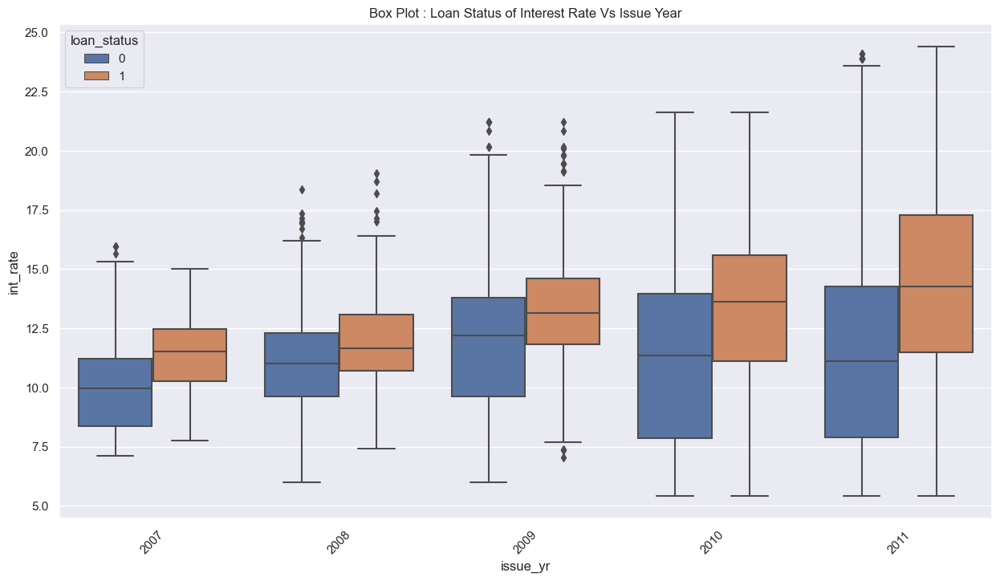

In [112]:
plt.figure(figsize=(15,8))
sns.boxplot(data=df2,x='issue_yr',y='int_rate',hue='loan_status')
plt.title("Box Plot : Loan Status of Interest Rate Vs Issue Year")
plt.xticks(rotation=45)
plt.show()

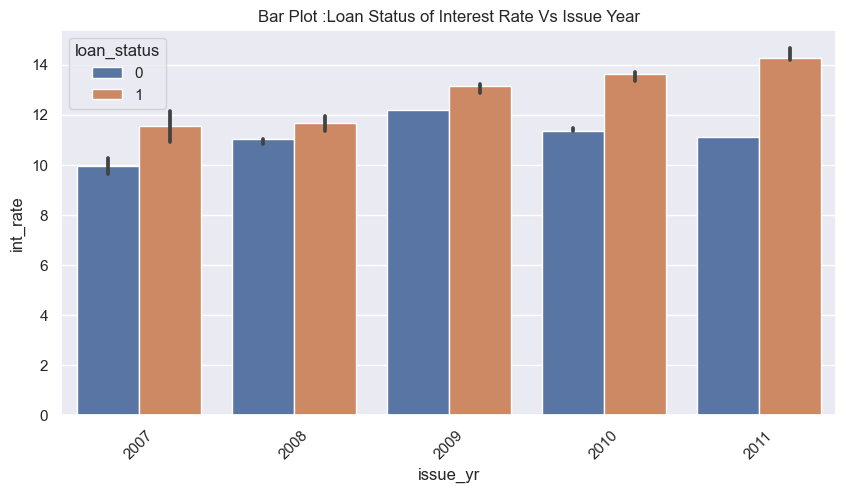

In [113]:
plt.figure(figsize=(10,5))
sns.barplot(data=df2,x='issue_yr',y='int_rate',hue='loan_status',estimator='median')
plt.xticks(rotation=45)
plt.title("Bar Plot :Loan Status of Interest Rate Vs Issue Year")
plt.show()

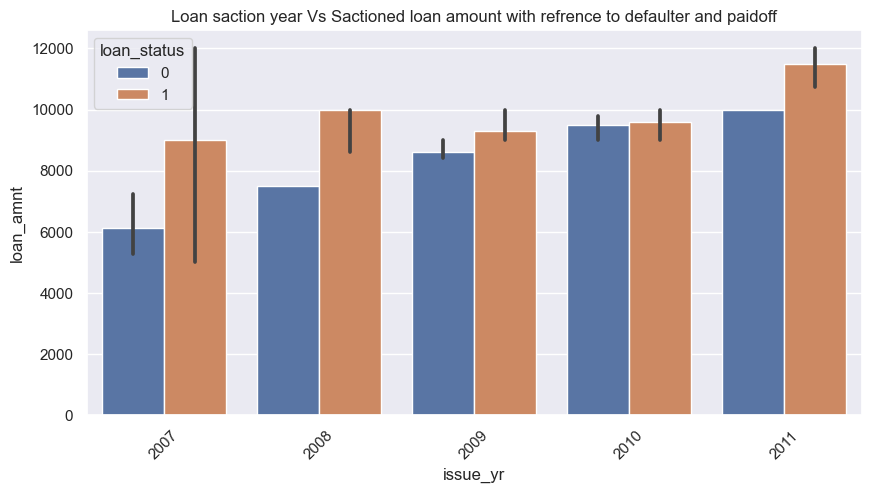

In [114]:

plt.figure(figsize=(10,5))
sns.barplot(data=df2,x='issue_yr',y='loan_amnt',hue='loan_status',estimator='median')
plt.xticks(rotation=45)
plt.title('Loan saction year Vs Sactioned loan amount with refrence to defaulter and paidoff')
plt.show()

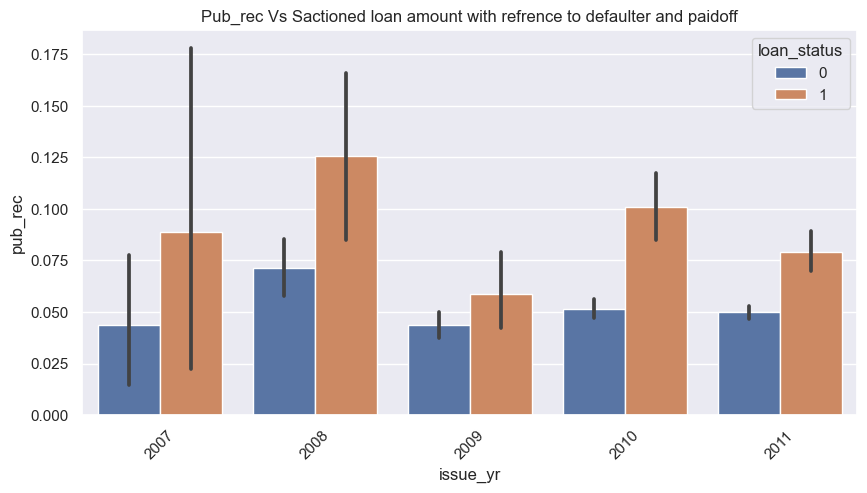

In [115]:
plt.figure(figsize=(10,5))
sns.barplot(data=df2,x='issue_yr',y='pub_rec',hue='loan_status')
plt.xticks(rotation=45)
plt.title('Pub_rec Vs Sactioned loan amount with refrence to defaulter and paidoff')
plt.show()

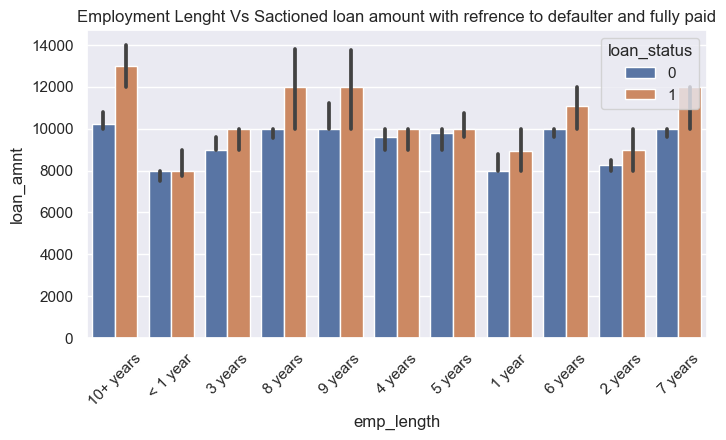

In [116]:
plt.figure(figsize=(8,4))
sns.barplot(data=df2,x='emp_length',y='loan_amnt',hue='loan_status',estimator='median')
plt.xticks(rotation=45)
plt.title('Employment Lenght Vs Sactioned loan amount with refrence to defaulter and fully paid')
plt.show()

In [117]:
df2=df2.drop(columns=['url','desc','emp_title','issue_d','title','zip_code','earliest_cr_line','initial_list_status','last_pymnt_d','last_credit_pull_d'])

In [118]:
df2.shape

(38577, 42)

In [119]:
df2=df2.drop(columns=['id', 'member_id','delinq_2yrs','inq_last_6mths','policy_code','collection_recovery_fee'])
df2.shape

(38577, 36)

In [120]:
# Plot using functions

def plot_segmented(cat_var):
    plt.figure(figsize=(10,6))
    sns.barplot(data=df2, x=cat_var,y='loan_status',hue='purpose')
    plt.show()

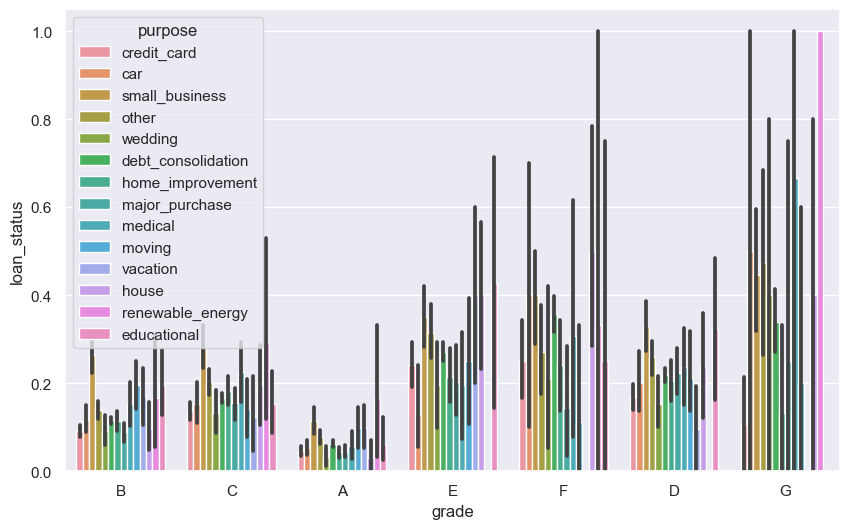

In [121]:
plot_segmented('grade')

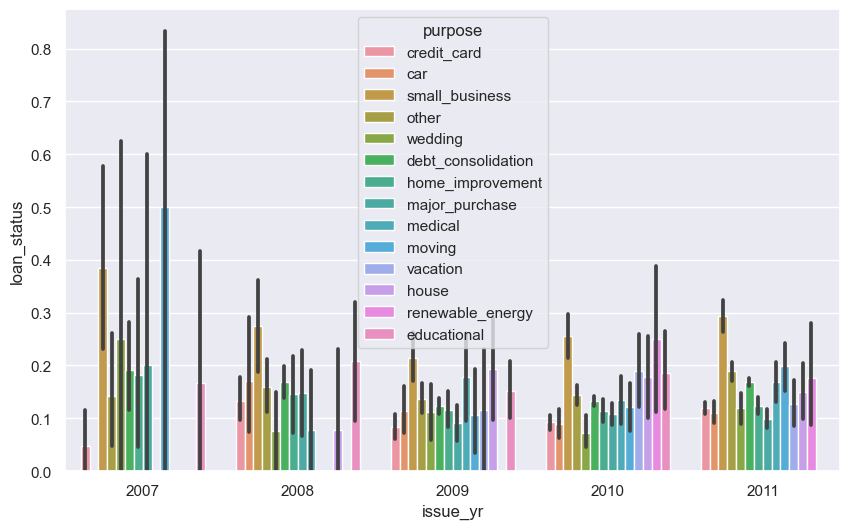

In [122]:
plot_segmented('issue_yr')

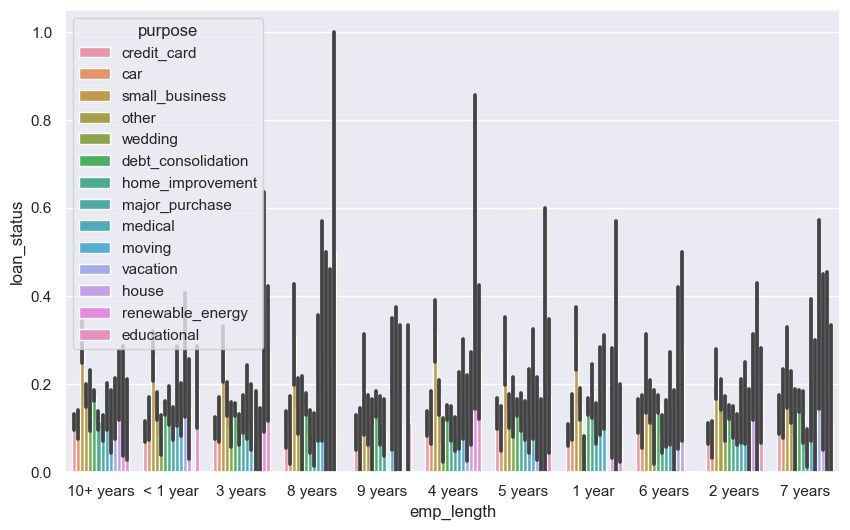

In [123]:
plot_segmented('emp_length')

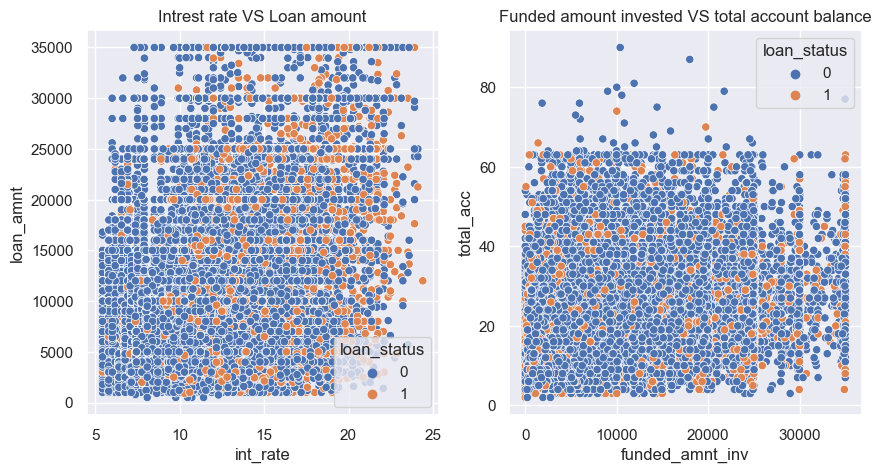

In [124]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))


sns.scatterplot(data=df2,  x='int_rate',y='loan_amnt',hue='loan_status', ax=axes[0])
sns.scatterplot(data=df2, x='funded_amnt_inv', y='total_acc',hue='loan_status', ax=axes[1])

# Set titles for each plot
axes[0].set_title('Intrest rate VS Loan amount')
axes[1].set_title('Funded amount invested VS total account balance')

# Show the plots
plt.show()

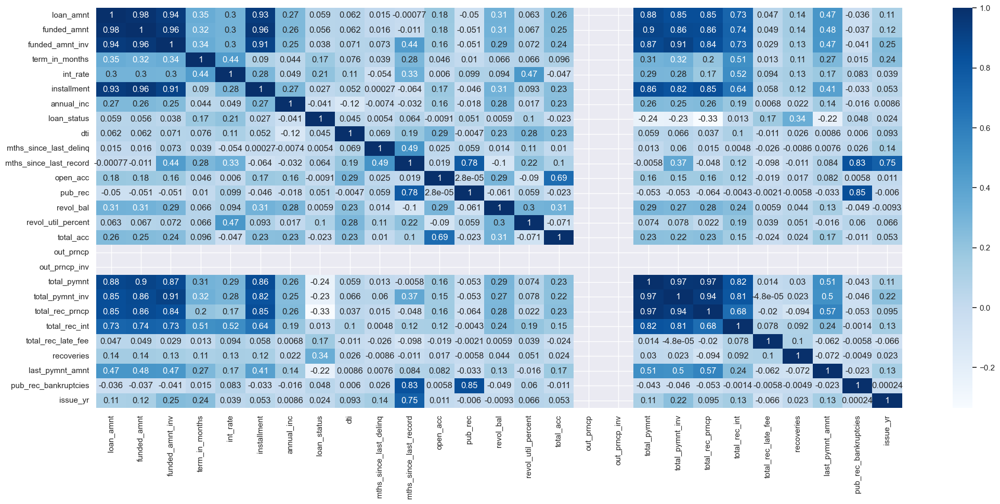

In [125]:
plt.figure(figsize=(25,10))
sns.heatmap(df2.corr(),cmap='Blues',annot=True)
plt.show()

In [126]:
corr_loan_status=df2.corrwith(df2['loan_status']).sort_values(ascending=False)
corr_loan_status

loan_status               1.000000
recoveries                0.339562
int_rate                  0.211390
term_in_months            0.173487
total_rec_late_fee        0.165115
revol_util_percent        0.099990
mths_since_last_record    0.063709
loan_amnt                 0.059463
funded_amnt               0.056497
pub_rec                   0.051001
pub_rec_bankruptcies      0.047757
dti                       0.045078
funded_amnt_inv           0.037781
installment               0.027153
issue_yr                  0.024451
total_rec_int             0.013008
revol_bal                 0.005854
mths_since_last_delinq    0.005377
open_acc                 -0.009140
total_acc                -0.022608
annual_inc               -0.040867
last_pymnt_amnt          -0.222524
total_pymnt_inv          -0.232906
total_pymnt              -0.235898
total_rec_prncp          -0.334944
out_prncp                      NaN
out_prncp_inv                  NaN
dtype: float64

In [127]:
pd.DataFrame(corr_loan_status)

,0
loan_status,1.000000
recoveries,0.339562
int_rate,0.211390
term_in_months,0.173487
total_rec_late_fee,0.165115
revol_util_percent,0.099990
mths_since_last_record,0.063709
loan_amnt,0.059463
funded_amnt,0.056497
pub_rec,0.051001


<Axes: >

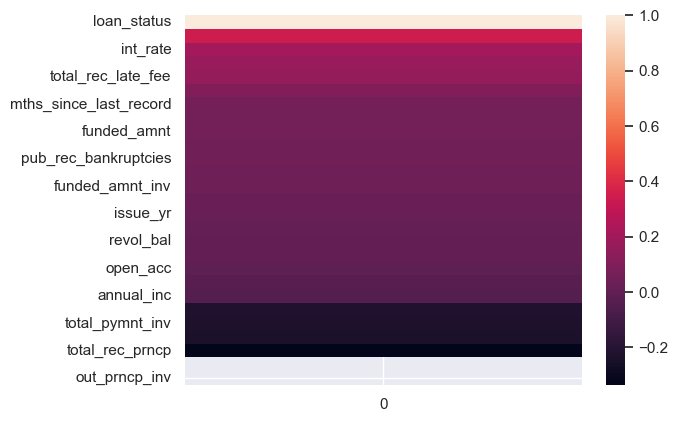

In [128]:
sns.heatmap(pd.DataFrame(corr_loan_status))

In [129]:
list=corr_loan_status[corr_loan_status.values>abs(0.1)].index
list

Index(['loan_status', 'recoveries', 'int_rate', 'term_in_months',
       'total_rec_late_fee'],
      dtype='object')

In [131]:
bins=[0,5,10,15,20,25]
ff=pd.cut(df2['int_rate'],bins=bins,labels=['0%-5%','5%-10%','10%-15%','15%-20%','20%-25%'])
ff

0        10%-15%
1        15%-20%
2        15%-20%
3        10%-15%
5         5%-10%
          ...   
39712     5%-10%
39713    10%-15%
39714     5%-10%
39715     5%-10%
39716    10%-15%
Name: int_rate, Length: 38577, dtype: category
Categories (5, object): ['0%-5%' < '5%-10%' < '10%-15%' < '15%-20%' < '20%-25%']

In [132]:
print(" Percentage distribution of Intreset rate wit slabs :")
t=pd.DataFrame(ff.value_counts(normalize=True))
t


 Percentage distribution of Intreset rate wit slabs :


,int_rate
10%-15%,0.473469
5%-10%,0.319258
15%-20%,0.187314
20%-25%,0.019960
0%-5%,0.000000


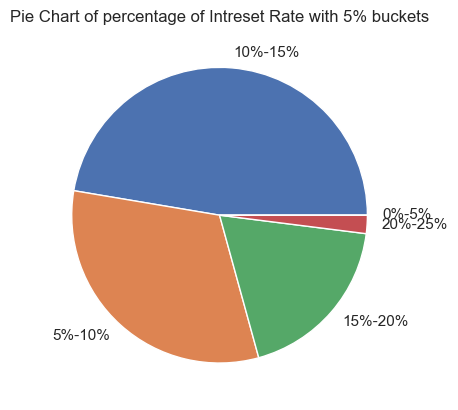

In [133]:
plt.pie(x=t['int_rate'],labels=['10%-15%','5%-10%','15%-20%','20%-25%','0%-5%'])
plt.title("Pie Chart of percentage of Intreset Rate with 5% buckets")
plt.show()

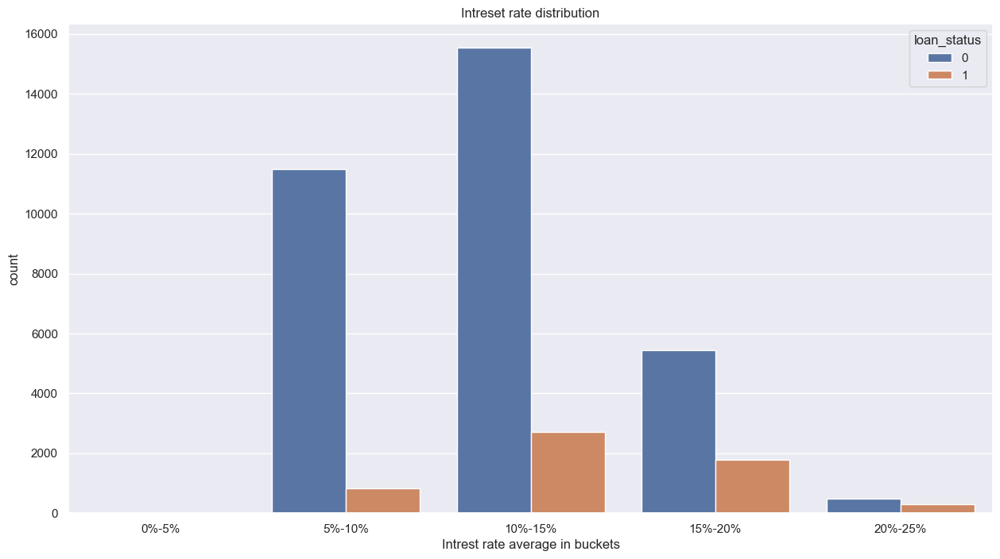

In [134]:
plt.figure(figsize=(15,8))
bins=[0,5,10,15,20,25]
sns.countplot(x=pd.cut(df2['int_rate'],bins=bins,labels=['0%-5%','5%-10%','10%-15%','15%-20%','20%-25%']),hue='loan_status',data=df2)
plt.xlabel('Intrest rate average in buckets')

plt.title('Intreset rate distribution')
plt.show()

In [135]:
df2.grade.unique()

array(['B', 'C', 'A', 'E', 'F', 'D', 'G'], dtype=object)

Grade: A
A
0    0.94
1    0.06
Name: loan_status, dtype: float64


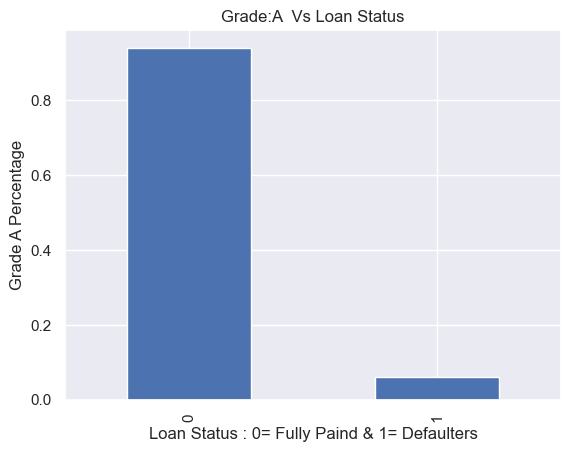



Grade: B
B
0    0.88
1    0.12
Name: loan_status, dtype: float64


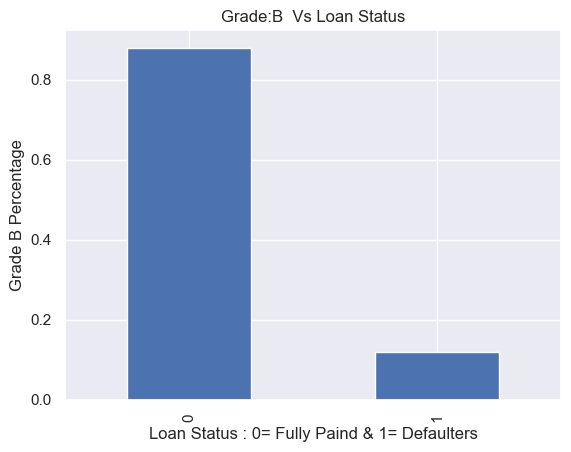



Grade: C
C
0    0.83
1    0.17
Name: loan_status, dtype: float64


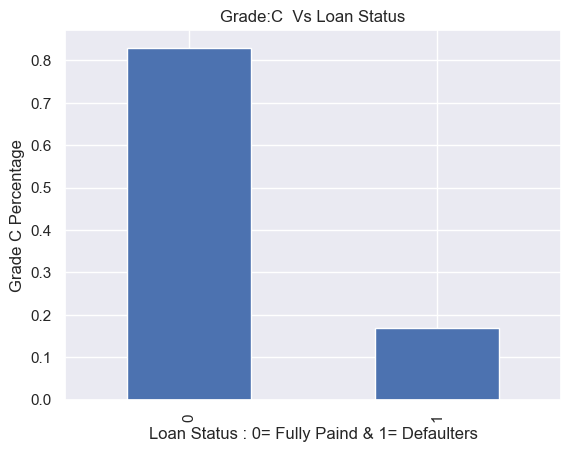



Grade: D
D
0    0.78
1    0.22
Name: loan_status, dtype: float64


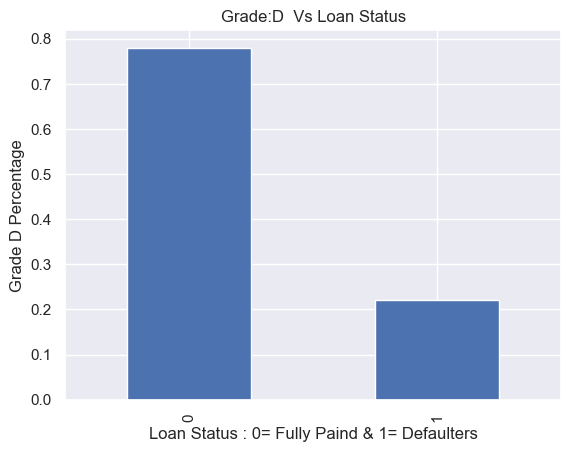



Grade: E
E
0    0.73
1    0.27
Name: loan_status, dtype: float64


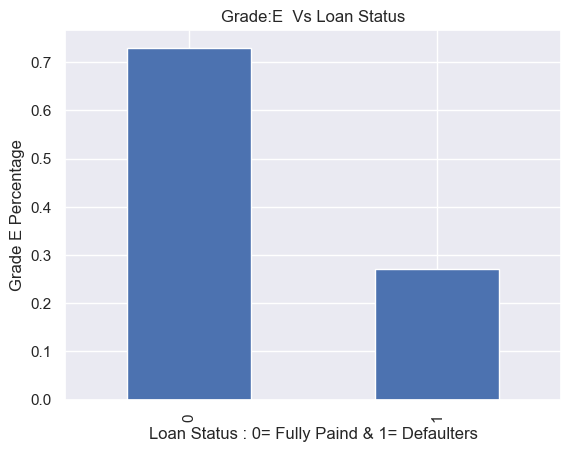



Grade: F
F
0    0.67
1    0.33
Name: loan_status, dtype: float64


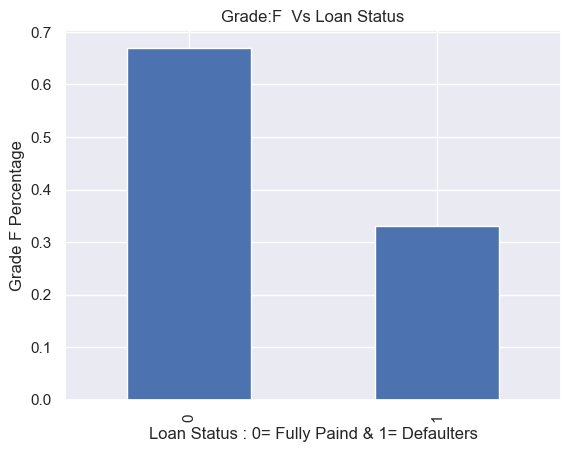



Grade: G
G
0    0.66
1    0.34
Name: loan_status, dtype: float64


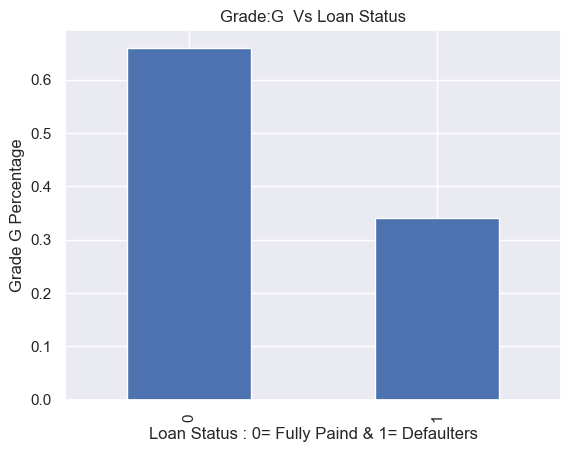

In [138]:
grades = ['A', 'B', 'C', 'D', 'E', 'F', 'G']

for grade in grades:
    a = df2[df2['grade'] == grade]
    b = a['loan_status'].value_counts(normalize=True).round(2)
    b.plot(kind='bar')
    plt.xlabel("Loan Status : 0= Fully Paind & 1= Defaulters")
    plt.ylabel('Grade '+grade+ ' Percentage')
    plt.title('Grade:'+grade+"  Vs Loan Status")
    print(f"Grade: {grade}")
    print(grade)
    print(b)
    plt.show()
    print("\n")

In [139]:
grades = ['A', 'B', 'C', 'D', 'E', 'F', 'G']

for grade in grades:
    a = df2[df2['grade'] == grade]
    b = a['loan_status'].value_counts(normalize=True).round(2)
   # b.plot(kind='bar')
#     plt.xlabel("Loan Status : 0= Fully Paind & 1= Defaulters")
#     plt.ylabel('Grade '+grade+ ' Percentage')
#     plt.title('Grade:'+grade+"  Vs Loan Status")
    print(f"Grade: {grade}")
  #  print(grade)
    print(b)
    plt.show()
  #  print("\n")

Grade: A
0    0.94
1    0.06
Name: loan_status, dtype: float64
Grade: B
0    0.88
1    0.12
Name: loan_status, dtype: float64
Grade: C
0    0.83
1    0.17
Name: loan_status, dtype: float64
Grade: D
0    0.78
1    0.22
Name: loan_status, dtype: float64
Grade: E
0    0.73
1    0.27
Name: loan_status, dtype: float64
Grade: F
0    0.67
1    0.33
Name: loan_status, dtype: float64
Grade: G
0    0.66
1    0.34
Name: loan_status, dtype: float64


# Auto EDA

# # 1. Using DTAle

In [140]:
#pip install dtale
#Hosing dtale requires firewall autentication
import dtale
d = dtale.show(df2)
d

## 2. AutoViz :Auto EDA of matplotlib

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
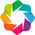

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [141]:
#!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class

In [142]:
AV = AutoViz_Class()
%matplotlib inline
p = AV.AutoViz('')
df2.to_csv('df2.csv')
dft = df2[:]
dft.shape

Dataname input must be a filename with path to that file or a Dataframe
Not able to read or load file. Please check your inputs and try again...


(38577, 36)

In [144]:
# from autoviz import AutoViz_Class
# AV = AutoViz_Class()
# %matplotlib inline

# filename = "df2.csv"
# target_variable = "loan_status"

# dft = AV.AutoViz(
#     filename,
#     sep=",",
#     depVar=target_variable,
#     dfte=None,
#     header=0,
#     verbose=1,
#     lowess=False,
#     chart_format="svg",
#     max_rows_analyzed=1000,
#     max_cols_analyzed=36,
#     save_plot_dir=None
# )

If the run the above got, wil get all realtion with beutiful plot, but file size will go beyond 40MD and thus will not be able to upload in Githhub, since the limitiation is upto 25MB only

# Inference from the Analysis


 In most of the cases, repayment term greater than 5 years leads to loan defaulters.
 Installment amount greater than 327 leads to defaulters.
 Lower annual incomer less than 37K leads to defaulters
 Debt to income ration greater than 15% leads to defaulters
 Most of the defaulters are the states AK, FL, SD, NV.
 Most of the loan issue months are in Dec, May, Sep and Jan leads to defaulters.
 Interest rate greater than 13% leads to defaulters.
 Revolving line utilization greater than 58% leads to defaulters.
 Loan purposes for small business, renewable energy and education tends to become defaulters in most of the
cases.
'''